# Gene Expression Analysis

In [1]:
# Loading the Packages

%reload_ext autoreload
%autoreload 2

import os
import warnings 
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import urllib.request
from scipy.stats import spearmanr,pearsonr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import math,adjustText
from sklearn.neighbors import NearestNeighbors
from matplotlib.collections import LineCollection

import umap
import umap.plot

# test

from anndata import AnnData

# test()

In [2]:
# Colormap related
import colorsys
from random import shuffle

def intervals(parts, start_point, end_point):
    duration = end_point - start_point
    part_duration = duration / parts
    return [((i * part_duration + (i + 1) * part_duration)/2) + start_point for i in range(parts)]

#### Examine transferred labels

In [3]:
focus_cell_type="Cerebellum neurons"

In [4]:
from pathlib import Path
celltypeannotaion="C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\Rank5Label\\"
Path(celltypeannotaion+focus_cell_type).mkdir(parents=True, exist_ok=True)
Path(celltypeannotaion+focus_cell_type+'\\IteractiveClustering').mkdir(parents=True, exist_ok=True)
Path(celltypeannotaion+focus_cell_type+'\\Spatial_cell_subcluster_map').mkdir(parents=True, exist_ok=True)

In [5]:
combine_adata=sc.read_h5ad('../output/adata_harmony_transfer.h5ad')

In [6]:
# combine_adata=sc.read_h5ad('output/adata_harmony_transfer.h5ad')
Oligo_adata=combine_adata[combine_adata.obs['Rank4_Defined']==focus_cell_type,:]

In [7]:
CBPC=pd.read_csv('../subclustering_20210923_selected_genes/CBPC.csv')

In [8]:
CBPC=combine_adata[[str(x)+'-st' for x in CBPC['index']],:].copy()


In [9]:
Oligo_adata=Oligo_adata.concatenate(CBPC)

... storing 'sample' as categorical
... storing 'CellID' as categorical
... storing 'Age' as categorical
... storing 'AnalysisPool' as categorical
... storing 'AnalysisProject' as categorical
... storing 'Bucket' as categorical
... storing 'CellConc' as categorical
... storing 'Cell_Conc' as categorical
... storing 'ChipID' as categorical
... storing 'Class' as categorical
... storing 'ClusterName' as categorical
... storing 'Comment' as categorical
... storing 'Comments' as categorical
... storing 'DateCaptured' as categorical
... storing 'Date_Captured' as categorical
... storing 'Description' as categorical
... storing 'Developmental_compartment' as categorical
... storing 'DonorID' as categorical
... storing 'Estimated Number of Cells' as categorical
... storing 'Flowcell' as categorical
... storing 'Fraction Reads in Cells' as categorical
... storing 'Label' as categorical
... storing 'Location_based_on' as categorical
... storing 'Mean Reads per Cell' as categorical
... storing '

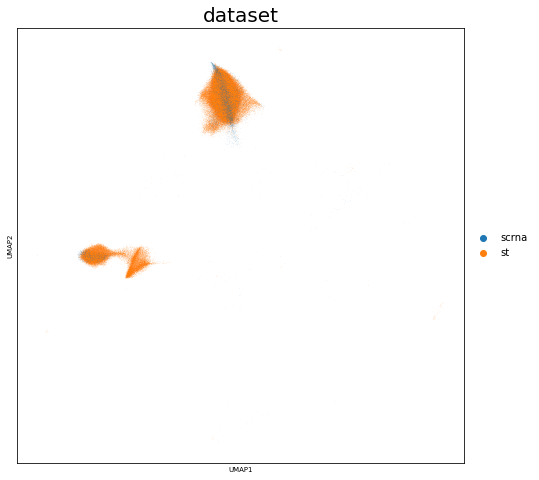

In [10]:
cluster_pl=sns.color_palette('tab10',2)
fig,ax = plt.subplots(figsize=(8,8))
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(7)
ax=sc.pl.umap(Oligo_adata,size=0.3, color='dataset',
              legend_fontweight ='light',legend_fontsize=10,palette=cluster_pl,ax=ax,show=False)
ax.title.set_fontsize(20)

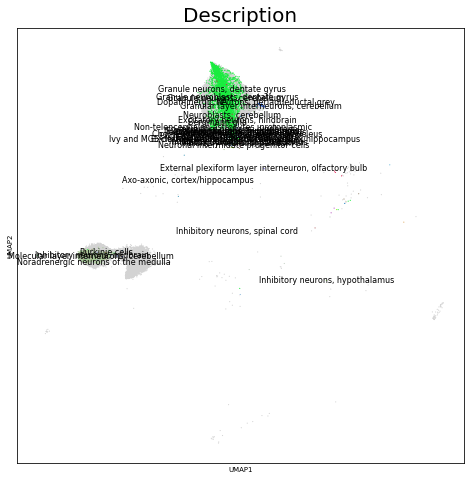

In [11]:
cluster_pl=list(np.random.rand(55,3))##sns.color_palette('tab20_r',2)
fig,ax = plt.subplots(figsize=(8,8))
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(7)
ax=sc.pl.umap(Oligo_adata,size=5, color='Description',legend_loc='on data',
              legend_fontweight ='light',legend_fontsize=8,palette=cluster_pl,ax=ax,show=False)
ax.title.set_fontsize(20)

KNN label transfer

In [12]:
from sklearn.cluster import DBSCAN,AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier

In [13]:
NA_adata=Oligo_adata

In [14]:
X_train=NA_adata.obsm['X_umap'][NA_adata.obs['dataset']=='scrna']
X_test=NA_adata.obsm['X_umap'][NA_adata.obs['dataset']=='st']
y_train=NA_adata.obs.loc[NA_adata.obs['dataset']=='scrna','Description']

classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

# NA_adata.obs=NA_adata.obs.drop('labels',axis=1)
NA_adata.obs.loc[NA_adata.obs['dataset']=='st','labels']=y_pred
NA_adata.obs.loc[NA_adata.obs['dataset']=='scrna','labels']=y_train

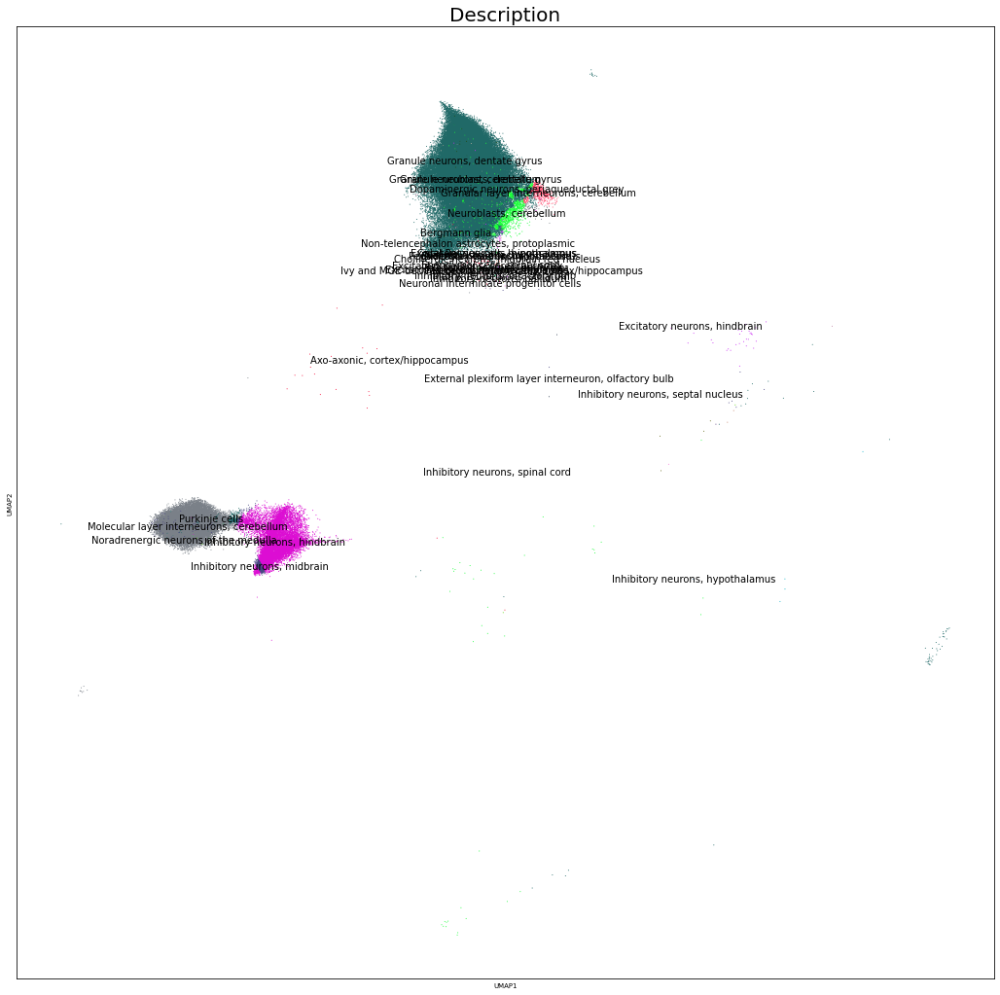

In [15]:
cluster_pl=list(np.random.rand(40,3))#sns.color_palette('tab20_r',2)
NA_adata.obs['labels']=NA_adata.obs['labels'].astype('category')
fig,ax = plt.subplots(figsize=(18,18))
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(7)
ax=sc.pl.umap(NA_adata,size=4, color='labels',legend_loc='on data',
              legend_fontweight ='light',legend_fontsize=10,palette=cluster_pl,ax=ax,show=False)
ax.set_title('Description')
ax.title.set_fontsize(20)

In [16]:
# label_Rank1_num=np.zeros((2,NA_adata.obs['TaxonomyRank1'].unique().shape[0]-1))
label_Rank1=np.zeros((NA_adata.obs['labels'].unique().shape[0],NA_adata.obs['Description'].unique().shape[0]-1))

for indi,i in enumerate(NA_adata.obs['labels'].unique()):
    pd_cluster_i=NA_adata.obs.loc[NA_adata.obs['labels']==i,:]

    #num of st and scrna
#     label_Rank1[ind,0]=pd.value_counts(pd_cluster_i['dataset'])['st']
#     label_Rank1[ind,1]=pd.value_counts(pd_cluster_i['dataset'])['scrna']

    s=pd.value_counts(pd_cluster_i['Description'])
    for indj, j in enumerate(NA_adata.obs['Description'].cat.categories):
        label_Rank1[indi,indj]=s[j]

In [17]:
label_Rank1_per=label_Rank1.copy()
for i in range(4):
    label_Rank1_per[i]=label_Rank1[i]/sum(label_Rank1[i])

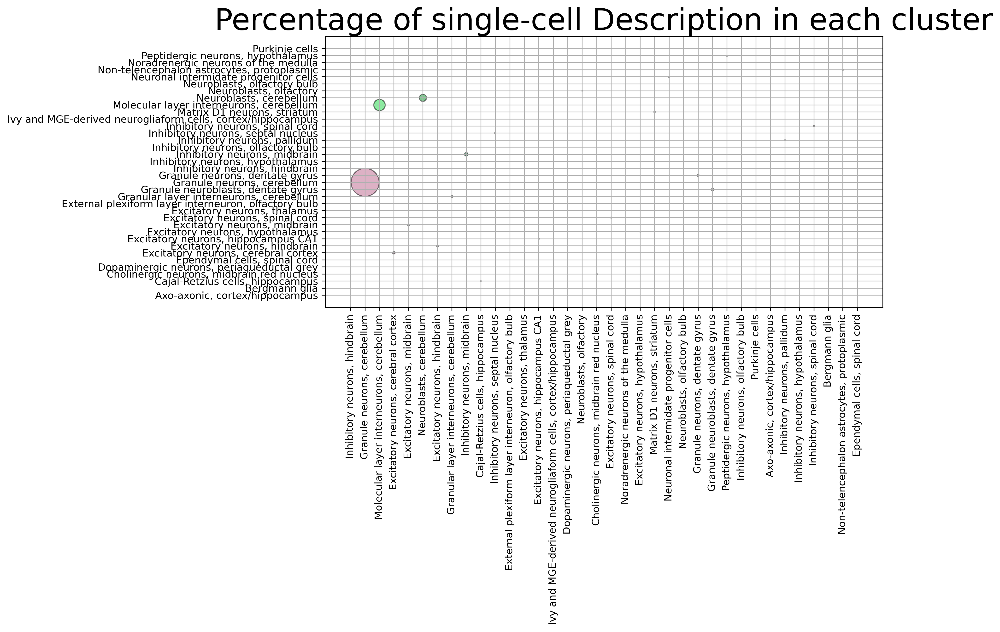

In [18]:
from itertools import product
plt.figure(figsize=(10,5),dpi=300)
plt.grid(True)
plt.xticks(np.arange(label_Rank1.shape[1]), NA_adata.obs['labels'].unique(),rotation=90,fontsize=10)  
plt.yticks(np.arange(label_Rank1.shape[1]), NA_adata.obs['Description'].cat.categories,fontsize=10)  
for i,j in product(range(label_Rank1.shape[1]),range(label_Rank1.shape[1])):
    plt.scatter(i,j,s=label_Rank1[i,j]/5,color=cluster_pl[i],alpha=0.5,edgecolor='k')
plt.title('Percentage of single-cell Description in each cluster',fontsize=30)
plt.show()

In [19]:
NA_adata_st=NA_adata[NA_adata.obs['dataset']=='st',:]
NA_adata_sc=NA_adata[NA_adata.obs['dataset']=='scrna',:]

gene markers in KNN transfered cluster

In [20]:
value_counts_name=np.array(NA_adata_st.obs['labels'].value_counts().index)
goodlist=list(value_counts_name[list(NA_adata_st.obs['labels'].value_counts()>150)])

In [21]:
ifgood=[x in goodlist for x in NA_adata_sc.obs['labels']]
NA_adata_sc=NA_adata_sc[ifgood,:]

ifgood=[x in goodlist for x in NA_adata_st.obs['labels']]
NA_adata_st=NA_adata_st[ifgood,:]

In [22]:
sc.tl.rank_genes_groups(NA_adata_st, 'labels', method='t-test')

Trying to set attribute `.uns` of view, copying.


In [23]:
# sc.tl.rank_genes_groups(NA_adata_st, 'leiden', method='wilcoxon')
# sc.pl.rank_genes_groups(NA_adata_st, n_genes=25, sharey=False)

In [24]:
markers = []
temp = pd.DataFrame(NA_adata_st.uns['rank_genes_groups']['names']).head(5)
for i in range(temp.shape[1]):
    curr_col = temp.iloc[:, i].to_list()
    markers = markers + curr_col
    print(i, curr_col)
    
print(markers)

0 ['PENK', 'LGI2', 'SLC32A1', 'GAD1', 'GRM2']
1 ['CBLN1', 'CBLN3', 'NREP', 'SLC17A7', 'NEUROD1']
2 ['CAR8', 'PCP2', 'PPP1R17', 'PRKCG', 'PVALB']
3 ['CAR8', 'PCP2', 'PRKCG', 'PVALB', 'PPP1R17']
4 ['PVALB', 'GAD1', 'PRKCD', 'KIT', 'WHRN']
5 ['MBP', 'PTGDS', 'CAR2', 'TRF', 'APOD']
['PENK', 'LGI2', 'SLC32A1', 'GAD1', 'GRM2', 'CBLN1', 'CBLN3', 'NREP', 'SLC17A7', 'NEUROD1', 'CAR8', 'PCP2', 'PPP1R17', 'PRKCG', 'PVALB', 'CAR8', 'PCP2', 'PRKCG', 'PVALB', 'PPP1R17', 'PVALB', 'GAD1', 'PRKCD', 'KIT', 'WHRN', 'MBP', 'PTGDS', 'CAR2', 'TRF', 'APOD']


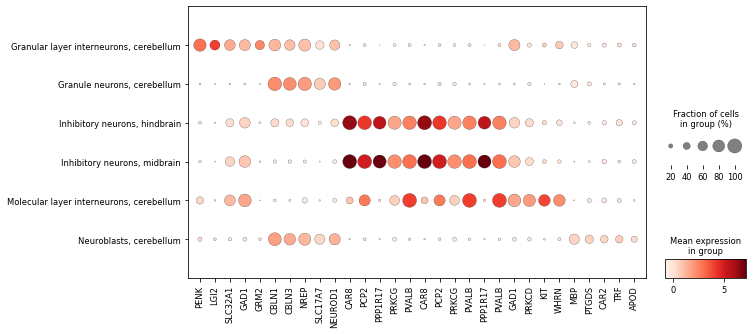

In [25]:
sc.pl.dotplot(NA_adata_st, markers, groupby='labels',figsize=(10,5))
sc.set_figure_params(scanpy=True, fontsize=10)

single cell

In [26]:
sc.tl.rank_genes_groups(NA_adata_sc, 'labels', method='t-test')

Trying to set attribute `.uns` of view, copying.


In [27]:
markers = []
temp = pd.DataFrame(NA_adata_sc.uns['rank_genes_groups']['names']).head(5)
for i in range(temp.shape[1]):
    curr_col = temp.iloc[:, i].to_list()
    markers = markers + curr_col
    print(i, curr_col)
    
print(markers)

0 ['LGI2', 'CST3', 'PENK', 'SLC32A1', 'LMX1A']
1 ['CALB2', 'SLC17A7', 'GABRA6', 'CBLN3', 'NEUROD1']
2 ['NCCRP1', 'LMX1A', 'ANGPT2', 'IGSF1', 'ACTA2']
3 ['PCP4', 'PVALB', 'GAD1', 'KIT', 'LMX1A']
4 ['PVALB', 'PCP4', 'GAD1', 'KIT', 'IFITM1']
5 ['TMSB4X', 'NFIB', 'STMN2', 'ZBTB20', 'SOX4']
['LGI2', 'CST3', 'PENK', 'SLC32A1', 'LMX1A', 'CALB2', 'SLC17A7', 'GABRA6', 'CBLN3', 'NEUROD1', 'NCCRP1', 'LMX1A', 'ANGPT2', 'IGSF1', 'ACTA2', 'PCP4', 'PVALB', 'GAD1', 'KIT', 'LMX1A', 'PVALB', 'PCP4', 'GAD1', 'KIT', 'IFITM1', 'TMSB4X', 'NFIB', 'STMN2', 'ZBTB20', 'SOX4']


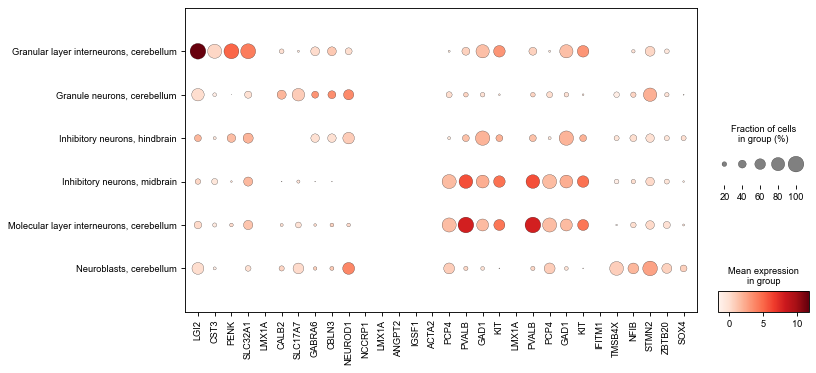

In [28]:
sc.pl.dotplot(NA_adata_sc, markers, groupby='labels',figsize=(10,5))
sc.set_figure_params(scanpy=True, fontsize=10)

leiden

In [29]:
Oligo_adata_st=NA_adata[NA_adata.obs['dataset']=='st',:].copy()

In [30]:
Oligo_adata_st.obs['labels'].value_counts()

Granule neurons, cerebellum                             123983
Molecular layer interneurons, cerebellum                 19935
Inhibitory neurons, hindbrain                            11761
Neuroblasts, cerebellum                                   1427
Inhibitory neurons, midbrain                              1022
Granular layer interneurons, cerebellum                    484
Excitatory neurons, hindbrain                               37
Excitatory neurons, cerebral cortex                         32
Excitatory neurons, midbrain                                11
Inhibitory neurons, septal nucleus                           3
Excitatory neurons, thalamus                                 3
Cajal-Retzius cells, hippocampus                             3
External plexiform layer interneuron, olfactory bulb         2
Name: labels, dtype: int64

Filtering

In [31]:
from sklearn.neighbors import NearestNeighbors
points=Oligo_adata_st.obsm['X_umap']
nbrs = NearestNeighbors(n_neighbors=16, algorithm='auto').fit(points)
distances, indices = nbrs.kneighbors(points)

In [32]:
test=np.sum(distances,axis=1)
# fig,(ax1,ax2)=plt.subplots(1,2,sharey=True)
# ax1.hist(test.tolist(),bins=20)
# ax2.hist(test[(test<np.quantile(test,0.98) )].tolist(),bins=20)

In [33]:
Oligo_adata_st_filter=Oligo_adata_st[test<np.quantile(test,1),:].copy()

In [34]:
sc.pp.neighbors(Oligo_adata_st_filter, n_neighbors=10, n_pcs=40)
sc.tl.umap(Oligo_adata_st_filter)

In [35]:
# leiden clustering
sc.tl.leiden(Oligo_adata_st_filter, resolution = 0.001)

In [36]:
pd.value_counts(Oligo_adata_st_filter.obs['leiden'])

0    158702
Name: leiden, dtype: int64

In [37]:
Oligo_adata_st_filter=Oligo_adata_st_filter[Oligo_adata_st_filter.obs['leiden']=='0',:]

In [38]:
# adata_raw=sc.read_h5ad('output/adata_raw.h5ad')
adata_st=sc.read_h5ad('../output/adata_afterbatch.h5ad')

oligo_index=[x.replace("-st","") for x in Oligo_adata_st_filter.obs.index]
oligo_index=[x.replace("-1","") for x in oligo_index]
oligo_index=[x.replace("-0","") for x in oligo_index]

adata_st_oligo=adata_st[oligo_index,:]
# adata_oligo_raw=adata_raw[oligo_index,:]

In [39]:
# Run PCA
sc.tl.pca(adata_st_oligo, n_comps =50,svd_solver='arpack')
sc.pp.neighbors(adata_st_oligo, n_neighbors=30, n_pcs=50)
sc.tl.umap(adata_st_oligo)

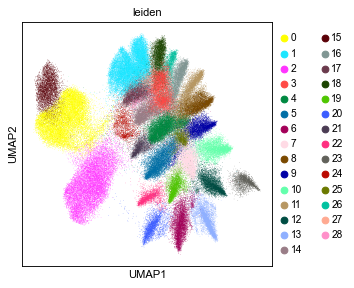

In [40]:
sc.tl.leiden(adata_st_oligo)
sc.pl.umap(adata_st_oligo, color=['leiden'])


subclustering on '1'

In [41]:
# adata_1=adata_st_oligo[adata_st_oligo.obs['leiden']=='Inhibitory neurons, hindbrain',:].copy()

In [42]:
# cluster = AgglomerativeClustering(n_clusters=2,affinity='euclidean', linkage='ward')
# adata_1.obs['cell_type'] = cluster.fit_predict(adata_1.obsm['X_pca']).astype(str)

In [43]:
# sc.tl.leiden(adata_1,resolution=0.3)
# cluster_pl=sns.color_palette('tab20',21)
# sc.pl.umap(adata_1,size=5,legend_loc='on data', legend_fontsize=6,color=['leiden','labels'],palette=cluster_pl)

In [44]:
# adata_st_oligo.obs['leiden']=adata_st_oligo.obs['leiden'].astype('int')
# adata_st_oligo.obs.loc[adata_1[adata_1.obs['cell_type']=='0',:].obs.index,'leiden']=27
# adata_st_oligo.obs['leiden']=adata_st_oligo.obs['leiden'].astype('category')


UMAP plot using all genes

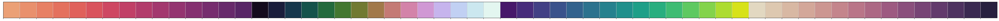

In [45]:
cluster_pl1=sns.color_palette('flare',15)
cluster_pl3=sns.color_palette("cubehelix",15)
cluster_pl4=sns.color_palette('viridis',15)
cluster_pl5=sns.color_palette('ch:s=-.2,r=.6',15)
cluster_pl=cluster_pl1+cluster_pl3+cluster_pl4+cluster_pl5
cluster_cmap = ListedColormap(cluster_pl)
sns.palplot(cluster_pl)

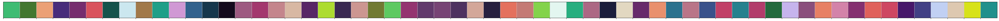

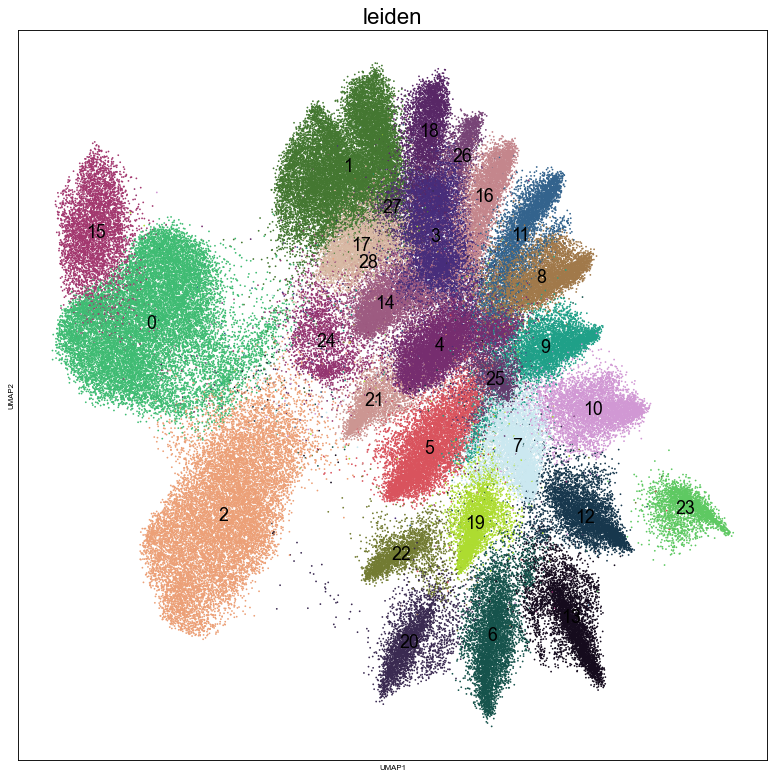

In [46]:
import random
random.shuffle(cluster_pl)
# cluster_pl=sns.color_palette('tab20',20)+sns.color_palette('tab20_r',20)#np.random.rand(25,3).tolist()##np.random.rand(25,3).tolist()##n=
cluster_cmap = ListedColormap(cluster_pl)
sns.palplot(cluster_pl)

fig,ax = plt.subplots(figsize=(12,12))
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(7)
ax=sc.pl.umap(adata_st_oligo,size=10, 
              legend_loc='on data',color='leiden',
              legend_fontweight ='light',legend_fontsize=16,palette=cluster_pl,ax=ax,show=False)
# ax.set_title('Oligo')
ax.title.set_fontsize(20)
fig.savefig('C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\'+focus_cell_type+'\\IteractiveClustering\\UMAP_full.png')

#### Cell type label annotation

In [47]:
oligo_index=[x.replace("-st","") for x in Oligo_adata_st_filter.obs.index]
oligo_index=[x.replace("-1","") for x in oligo_index]
oligo_index=[x.replace("-0","") for x in oligo_index]

inter,arra1,arra2=np.intersect1d(oligo_index,adata_st_oligo.obs.index,return_indices=True)
adata_st_oligo.obs.loc[inter,'labels']=list(Oligo_adata_st.obs.iloc[arra1]['labels'])

... storing 'labels' as categorical


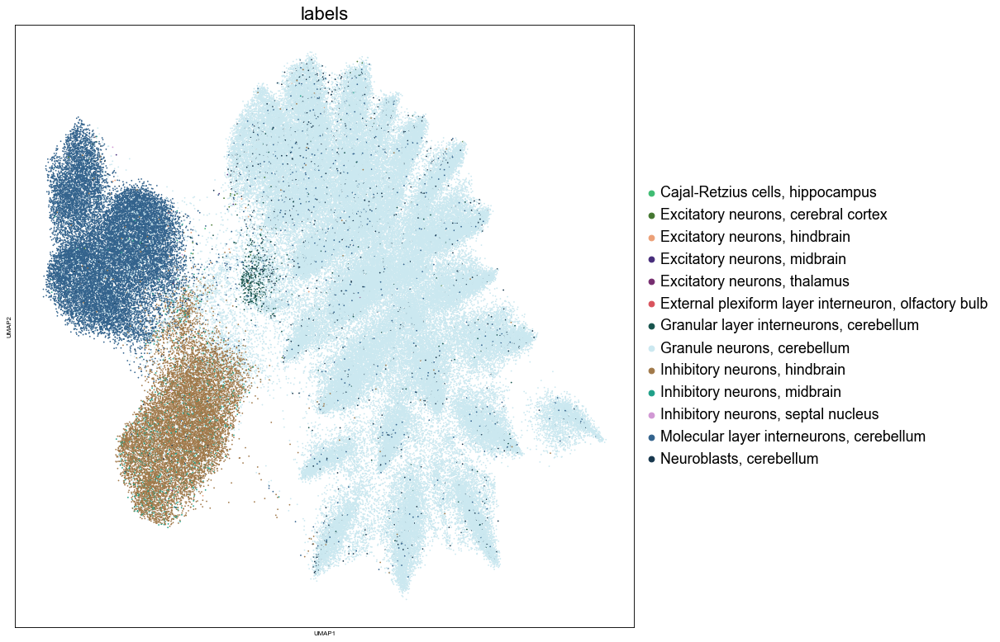

In [48]:
import random
# random.shuffle(cluster_pl)
# cluster_pl=sns.color_palette('tab20',20)#+sns.color_palette('tab20_r',20)#np.random.rand(25,3).tolist()##np.random.rand(25,3).tolist()##n=
# cluster_cmap = ListedColormap(cluster_pl)
# sns.palplot(cluster_pl)

fig,ax = plt.subplots(figsize=(12,12))
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(7)
ax=sc.pl.umap(adata_st_oligo,size=10, 
              color='labels',
              legend_fontweight ='light',legend_fontsize=16,palette=cluster_pl,ax=ax,show=False)
# ax.set_title('Oligo')
ax.title.set_fontsize(20)
fig.savefig('C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\'+focus_cell_type+'\\IteractiveClustering\\UMAP_full.png')

In [49]:
# labeld=adata_st_oligo.obs['leiden'].unique()
labeld=np.array(adata_st_oligo.obs['leiden'].unique()).astype('int')#.sort()
labeld.sort()
labeld=labeld.astype('str')
wellname=adata_st_oligo.obs['labels']

batch_type=np.zeros(([len(wellname.unique()),
                     len(labeld)]))
for ind,i in enumerate(wellname.unique()):
    cell_type=adata_st_oligo.obs.loc[wellname==i,'leiden']
    for indj,j in enumerate(labeld):
        batch_type[ind,indj]=sum(cell_type==j)

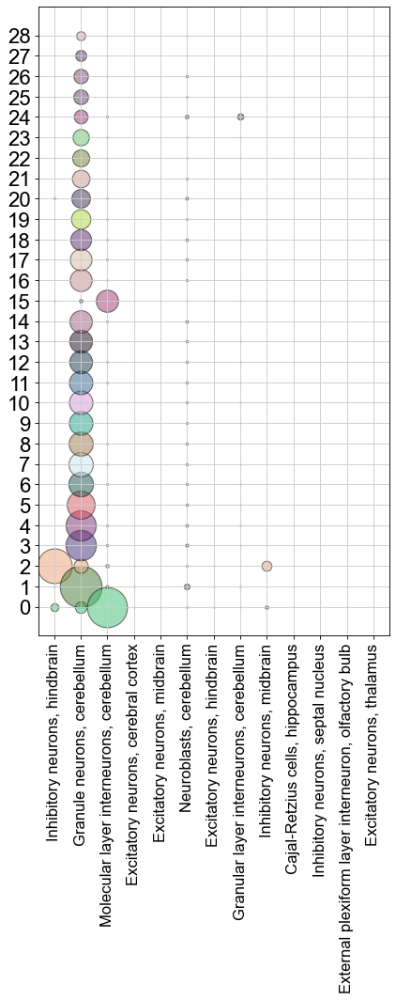

In [50]:
from itertools import product
plt.figure(figsize=(6,11))
# ax=fig.add_subplot(1,1,1)
plt.grid(True)
plt.xticks(np.arange(len(wellname.unique())),wellname.unique(),rotation=90,fontsize=15)  
plt.yticks(np.arange(len(labeld)), labeld,fontsize=20)  
for i,j in product(range(len(wellname.unique())),np.arange(len(labeld))):
    plt.scatter(i,j,s=batch_type[i,j]/10,color=cluster_pl[j],alpha=0.5,edgecolor='k')

plt.show()

In [51]:
new_cluster_names = ['Molecular layer interneurons-1',
                     'Granule neurons-1',
                     'Purkinje cells',
                    'Granule neurons-2',
                    'Granule neurons-3',
                    'Granule neurons-4',
                    'Granule neurons-5',
                    'Granule neurons-6',
                    'Granule neurons-7',
                    'Granule neurons-8',
                    'Granule neurons-9',
                    'Granule neurons-10',
                    'Granule neurons-11',
                    'Granule neurons-12',
                    'Granule neurons-13',
                    'Molecular layer interneurons-2',
                    'Granule neurons-14',
                    'Granule neurons-15',
                    'Granule neurons-16',
                    'Granule neurons-17',
                    'Granule neurons-18',
                    'Granule neurons-19',
                    'Granule neurons-20',
                    'Granule neurons-21',
                    'Granule neurons-22',
                    'Granule neurons-23',
                    'Granule neurons-24',
                    'Granule neurons-25',
                    'Granule neurons-26']
adata_st_oligo.rename_categories('leiden', new_cluster_names)

Constellation Plot

In [52]:
### curve
def hanging_line(point1, point2):
    a = (point2[1] - point1[1])/(np.cosh(point2[0]) - np.cosh(point1[0]))
    b = point1[1] - a*np.cosh(point1[0])
    x = np.linspace(point1[0], point2[0], 100)
    y = a*np.cosh(x) + b
    return (x,y)

In [53]:
### lines
def hanging_line(point1, point2):
    a = (point2[1] - point1[1])/(point2[0] - point1[0])
    b=point1[1]
    x = np.linspace(point1[0], point2[0], 100)
    y = a*(x - point1[0])+b
    return (x,y)

Granule neurons-15 0.1084169708029197 Granule neurons-1 0.028848610181862418


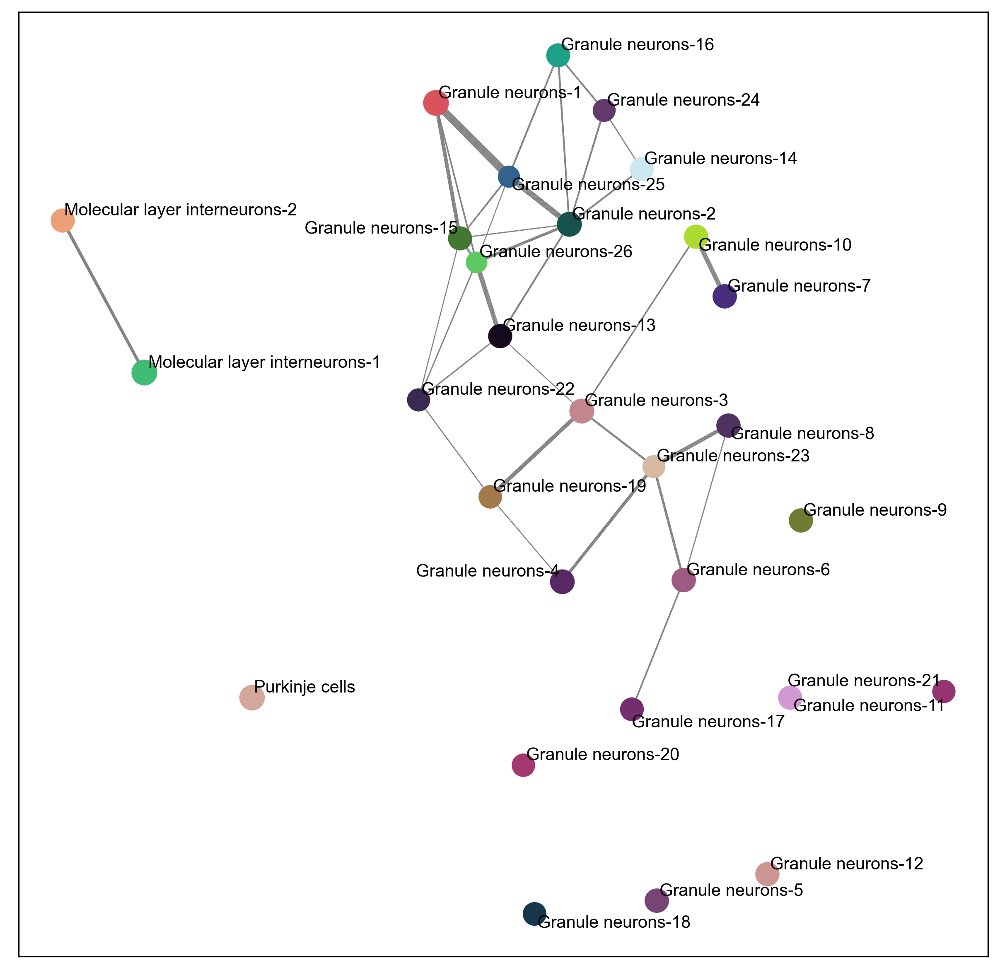

In [54]:
X_umap_loc=adata_st_oligo.obsm['X_umap']
leiden_umapcenter=pd.DataFrame(data={'leiden':[],'loc_1':[],'loc_2':[]})
leiden_width=pd.DataFrame(data={'leiden1':[],'leiden2':[],
                                'width_1':[]})

fig, ax = plt.subplots(figsize=(10,10),dpi=300)

#plot points and text
texts = []
for ind,i in enumerate(adata_st_oligo.obs['leiden'].unique()):
    leiden_i_point=X_umap_loc[adata_st_oligo.obs['leiden']==i,:]
    
    #find connection with 10-nn
    knn = NearestNeighbors(n_neighbors=10).fit(X_umap_loc)
    distances, indices = knn.kneighbors(leiden_i_point)
    pct_ofknn=pd.value_counts(adata_st_oligo.obs['leiden'][np.ravel(indices)])/np.ravel(indices).shape[0]
    knn_0_03=pct_ofknn#[pct_ofknn>0.03]
    for indj,j in enumerate(knn_0_03.index):
#         print(indj,j,knn_0_03[indj])
        leiden_width=leiden_width.append({'leiden1':i,'leiden2':j,'width_1':knn_0_03[indj]},ignore_index=True)

    #find center
    i_loc=np.mean(leiden_i_point, axis=0)
    leiden_umapcenter=leiden_umapcenter.append({'leiden':i,'loc_1':i_loc[0],'loc_2':i_loc[1]},ignore_index=True)

flag=1
#plot connections
for ind,i in enumerate(adata_st_oligo.obs['leiden'].unique()):
    i_knn=leiden_width.loc[leiden_width['leiden1']==i,:]
    i_knn=i_knn.loc[i_knn['width_1']>0.03,:]
    for indj,j in enumerate(i_knn['leiden2']):
        if i!=j:
            test=leiden_width.loc[((leiden_width['leiden1']==j) & (leiden_width['leiden2']==i))]
#             print(ind,i,i_knn.iloc[indj,:]['width_1'],indj,j,test['width_1'])
            
            point1=[leiden_umapcenter.loc[leiden_umapcenter['leiden']==i,:]['loc_1'].iloc[0],
                   leiden_umapcenter.loc[leiden_umapcenter['leiden']==i,:]['loc_2'].iloc[0]]

            point2=[leiden_umapcenter.loc[leiden_umapcenter['leiden']==j,:]['loc_1'].iloc[0],
                    leiden_umapcenter.loc[leiden_umapcenter['leiden']==j,:]['loc_2'].iloc[0]]            
            point1_width=i_knn.iloc[indj,:]['width_1']
            point2_width=test.iloc[0,:]['width_1']
            
            if flag==1:
                print(i,i_knn.iloc[indj,:]['width_1'],j,test.iloc[0,:]['width_1'])
                flag=0
            x,y = hanging_line(point1, point2)

            lwidths=[20*(point1_width+x*(point2_width-point1_width)/999) for x in (range(1000))]
            points = np.array([x, y]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)
            lc = LineCollection(segments, linewidths=lwidths,color='gray')
            ax.add_collection(lc)
            leiden_width=leiden_width.drop(index=test.index[0])

            
for ind,i in enumerate(adata_st_oligo.obs['leiden'].unique()):
    leiden_i_point=X_umap_loc[adata_st_oligo.obs['leiden']==i,:]   
    i_loc=np.mean(leiden_i_point, axis=0)
    ax.scatter(i_loc[0],i_loc[1],color=cluster_pl[ind],s=math.log(leiden_i_point.shape[0])*20,edgecolor=None,zorder=2)
    texts.append(ax.text(i_loc[0],i_loc[1], i ))   
adjustText.adjust_text(texts)

ax.set_xticks([])
ax.set_yticks([])
fig.show()
fig.savefig('C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\'+focus_cell_type+'\\IteractiveClustering\\ConstellationPlot_full.png')

In [55]:
#find gene markers
sc.tl.rank_genes_groups(adata_st_oligo, 'leiden', method='t-test')
# sc.tl.rank_genes_groups(adata_st_oligo, 'leiden', method='wilcoxon')

In [56]:
unique_cluster=new_cluster_names#list(adata_st_oligo.obs['leiden'].unique())
# unique_cluster=[int(x) for x in unique_cluster]

markers = []
markers_pval_row=[]
markers_row=[]

temp = pd.DataFrame(adata_st_oligo.uns['rank_genes_groups']['names']).head(5)
temp_score = pd.DataFrame(adata_st_oligo.uns['rank_genes_groups']['scores']).head(5)
temp_pvale = pd.DataFrame(adata_st_oligo.uns['rank_genes_groups']['pvals']).head(5)

for i in range(temp.shape[1]):
    curr_col = temp.iloc[:, i].to_list()
    curr_col_score = temp_score.iloc[:, i].to_list()
    curr_col_pvale=temp_pvale.iloc[:, i].to_list()
    list_true=[x>0 for x in curr_col_score]
    curr_col=list(np.array(curr_col)[list_true])
    curr_col_pvale=list(np.array(curr_col_pvale)[list_true])
    
    markers = markers + curr_col
    markers_row.append(curr_col)
    markers_pval_row.append(curr_col_pvale)
    print(i,unique_cluster[i], curr_col)

0 Molecular layer interneurons-1 ['PVALB', 'GAD1', 'PRKCD', 'WHRN', 'KIT']
1 Granule neurons-1 ['NRGN', 'CBLN1', 'RGS4', 'NREP', 'GRM5']
2 Purkinje cells ['CAR8', 'PCP2', 'PPP1R17', 'PRKCG', 'CALB1']
3 Granule neurons-2 ['TMEM163', 'GPSM1', 'CBLN1', 'NREP', 'CBLN3']
4 Granule neurons-3 ['CNKSR3', 'CBLN1', 'NREP', 'CBLN3', 'NEUROD1']
5 Granule neurons-4 ['LHX1', 'CBLN1', 'NREP', 'CBLN3', 'NEUROD1']
6 Granule neurons-5 ['GRM4', 'CBLN1', 'CBLN3', 'NREP', 'ADCY1']
7 Granule neurons-6 ['SLC22A4', 'CBLN1', 'NREP', 'CBLN3', 'NEUROD1']
8 Granule neurons-7 ['CALB2', 'CBLN1', 'NREP', 'CBLN3', 'SLC17A7']
9 Granule neurons-8 ['PAPPA', 'CBLN1', 'NEUROD1', 'CBLN3', 'ADCY1']
10 Granule neurons-9 ['NHLH2', 'CBLN1', 'NREP', 'CBLN3', 'NEUROD1']
11 Granule neurons-10 ['RNF152', 'CBLN1', 'CBLN3', 'NREP', 'SLC17A7']
12 Granule neurons-11 ['RD3L', 'CBLN1', 'NREP', 'NEUROD1', 'CBLN3']
13 Granule neurons-12 ['ANKRD34B', 'CBLN1', 'NREP', 'NEUROD1', 'CBLN3']
14 Granule neurons-13 ['PAX6', 'CBLN1', 'NREP', 'SLC1

In [57]:
markers_apper=[]
for i in markers:
    if i not in markers_apper:
        markers_apper.append(i)        

In [58]:
# sc.tl.dendrogram(adata_st_oligo, groupby='leiden')

In [59]:
# d = {'Cluster': [],'Number':[], 'Marker': [],'Marker_pval':[]}
# Cluster_Marker=pd.DataFrame(data=d)

In [60]:
# dendro_marker=[]
# test1=pd.value_counts(adata_st_oligo.obs['leiden'])

# for i in adata_st_oligo.uns['dendrogram_leiden']['categories_ordered']:
#     test=set(markers_row[unique_cluster.index( str(i) )])-set(dendro_marker)#markers_row[unique_cluster.index( i )]#
# #     print(i,test1.loc[i],markers_row[unique_cluster.index( i )])
#     Cluster_Marker=Cluster_Marker.append({
#         'Cluster':i,
#         'Number':int(test1.loc[i]),
#         'Marker':str(markers_row[unique_cluster.index( i )]).replace('\'',''),
#         'Marker_pval':markers_pval_row[unique_cluster.index( i )]}
#     ,ignore_index=True)
#     dendro_marker+=test

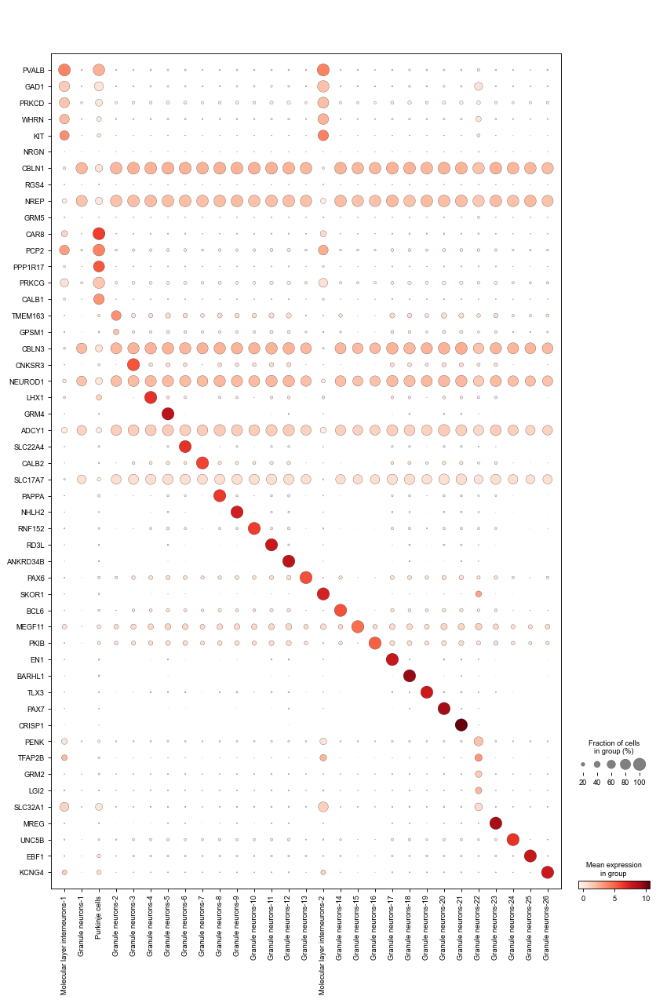

In [61]:
axes=sc.pl.dotplot(adata_st_oligo, markers_apper, groupby='leiden', swap_axes=True,return_fig=True)
axes.savefig('C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\'+focus_cell_type+'\\IteractiveClustering\\DotPlot_full.png')

In [135]:
# axes=sc.pl.stacked_violin(adata_st_oligo, markers_apper, groupby='leiden',return_fig=True)
# axes.savefig('C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\'+focus_cell_type+'\\IteractiveClustering\\DotPlot_full.png')

In [ ]:
# sc.tl.dendrogram(adata_st_oligo,groupby='leiden')
# sc.pl.tracksplot(adata_st_oligo,markers_apper,  groupby='leiden', cmap='viridis')

sankey

In [136]:
import plotly.graph_objects as go

pd_sc=adata_st_oligo.obs.copy()#[combine_adata.obs['dataset']=='scrna']
level1='labels'
level2='leiden'

labela=list(pd_sc[level1].unique())
labelb=list(pd_sc[level2].unique())

In [137]:
source1=np.zeros(pd_sc[level1].shape[0])
for indi,i in enumerate(pd_sc[level1]):
    source1[indi]=int(labela.index(i))
    
target1=np.zeros(pd_sc[level2].shape[0])
for indi,i in enumerate(pd_sc[level2]):
    target1[indi]=int(labelb.index(i)+len(labela))

In [138]:
source=[]
target=[]
value=[]
for indi,i in enumerate(np.unique(source1)):
    translateTR2id=target1[np.where(source1==i)]
    unique, counts = np.unique(translateTR2id, return_counts=True)
    for indj, j in zip(unique,counts):
#         print(i,indj, j)
        source.append(i)
        target.append(indj)
        value.append(j)

In [139]:
labelcolor=sns.color_palette('tab20',len(labela+labelb))#.as_hex()
labelcolor=['rgba' + str((*tuple(i*255 for i in j),0.8)) for j in labelcolor]
linkcolor=[np.array(labelcolor)[int(i)].replace("0.8", str(0.4))   for i in source]

In [140]:
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 21,
      thickness = 10,
      line = dict(color = "black", width = 0.5),
      label = labela+labelb,
      color = labelcolor
    ),
    link = dict(
      source = source, # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = target,
      value = value,
        color=linkcolor
  ))])

# fig.update_layout(title_text="scRNA label taxonomy", font_size=20,width=2000,
#     height=1500,)
fig.update_layout( font_size=20,width=2000,
    height=1500,)
fig.write_html("sankey-diagram-plotly1.html")

fig.show()

In [141]:
labeld=adata_st_oligo.obs['leiden'].unique()
wellname=adata_st_oligo.obs['labels']

batch_type=np.zeros(([len(wellname.unique()),
                     len(labeld)]))
for ind,i in enumerate(wellname.unique()):
    cell_type=adata_st_oligo.obs.loc[wellname==i,'leiden']
    for indj,j in enumerate(labeld):
        batch_type[ind,indj]=sum(cell_type==j)

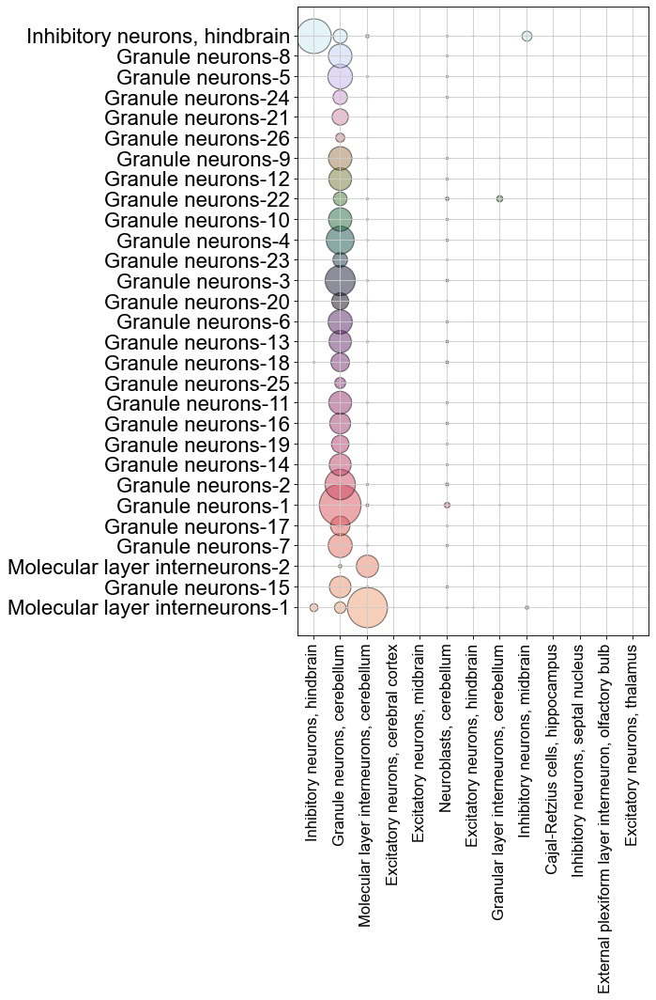

In [142]:
from itertools import product
plt.figure(figsize=(6,11))
# ax=fig.add_subplot(1,1,1)
plt.grid(True)
plt.xticks(np.arange(13),wellname.unique(),rotation=90,fontsize=15)  
plt.yticks(np.arange(len(labeld)), labeld,fontsize=20)  
for i,j in product(range(13),range(len(labeld))):
    plt.scatter(i,j,s=batch_type[i,j]/10,color=cluster_pl[j],alpha=0.5,edgecolor='k')

plt.show()

In [235]:
focus_sample='sagittal3'
test=adata_st_oligo.obs.loc[adata_st_oligo.obs['sample']==focus_sample,:].copy()

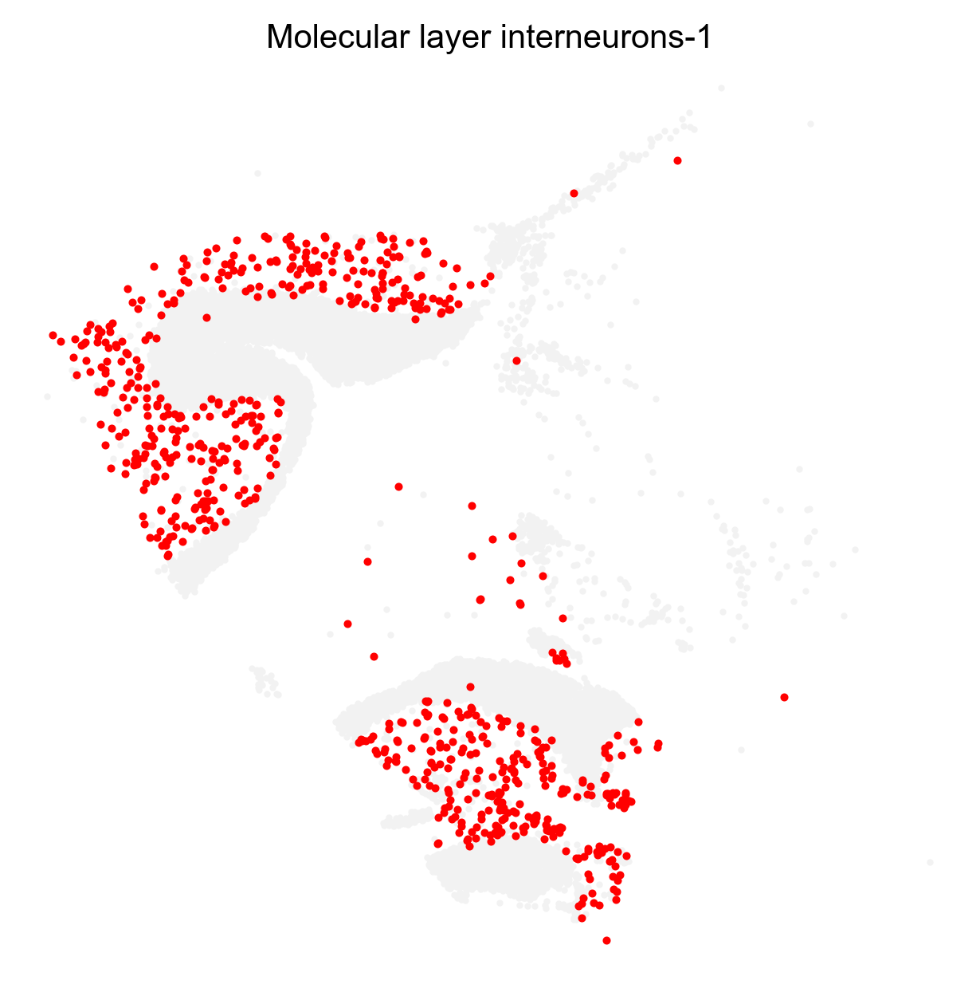

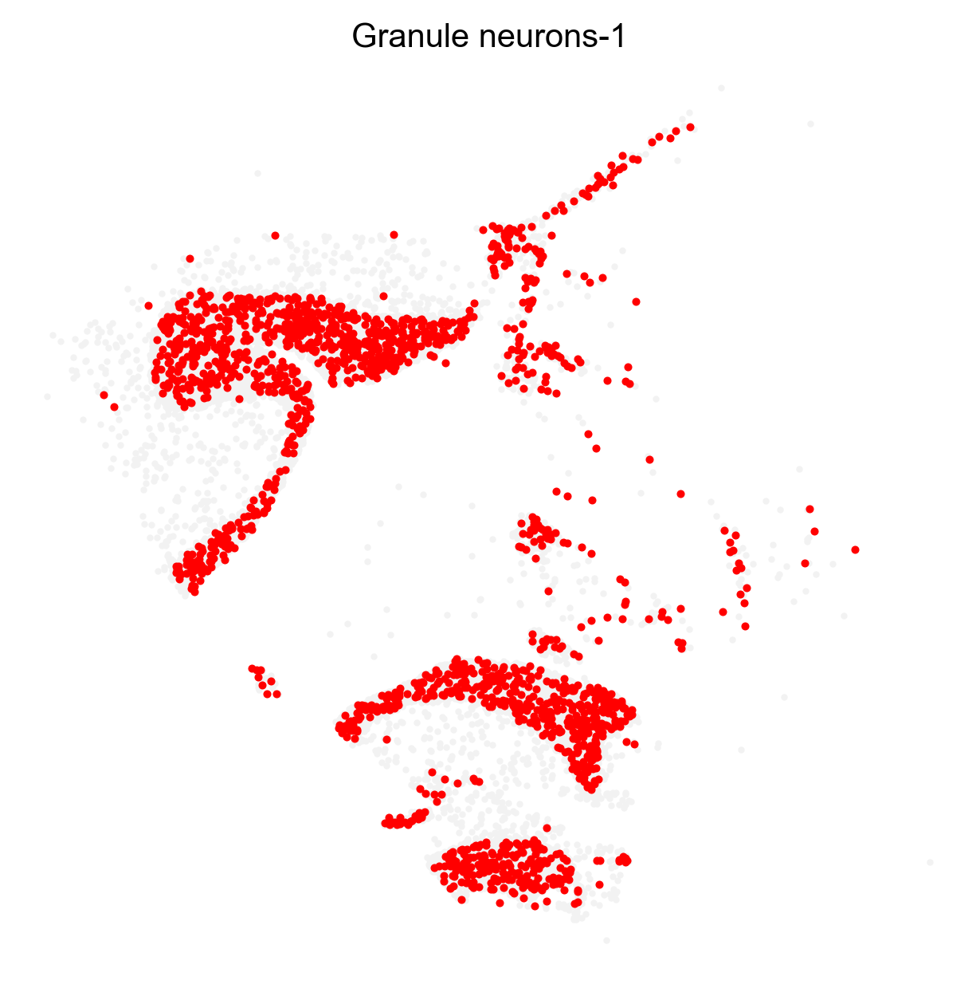

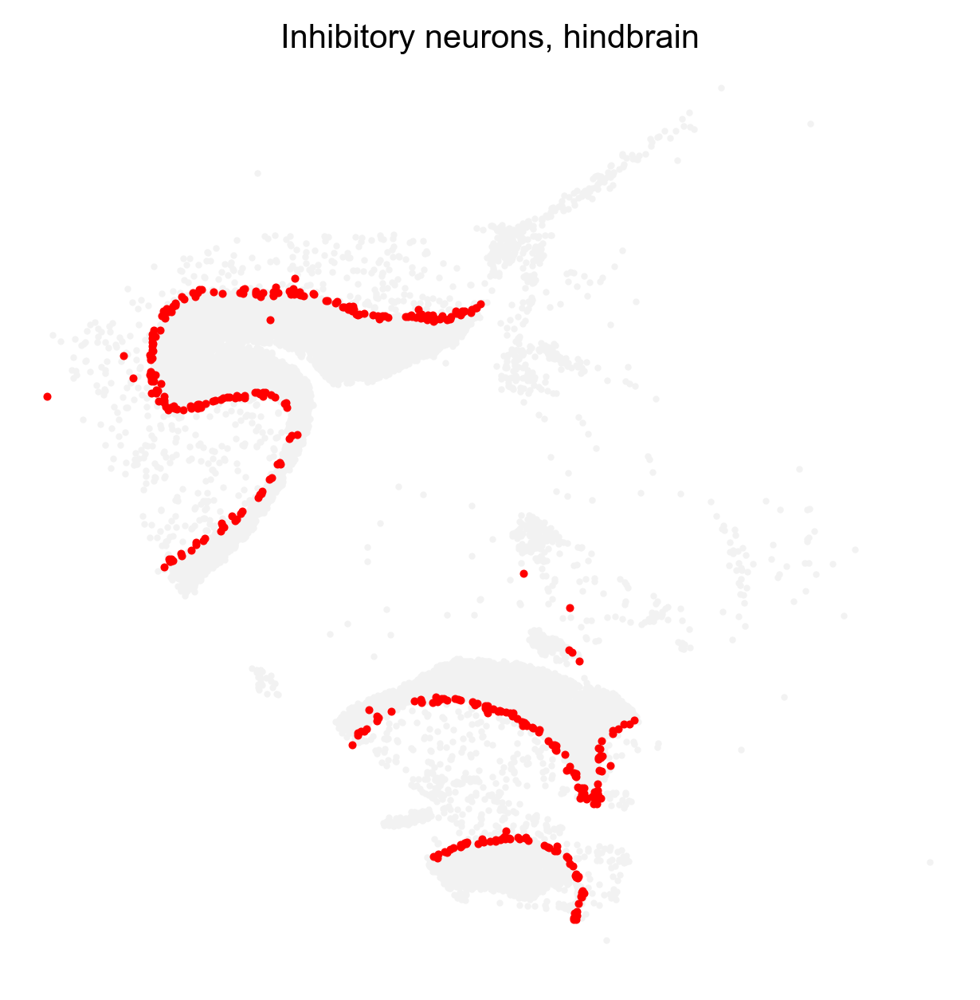

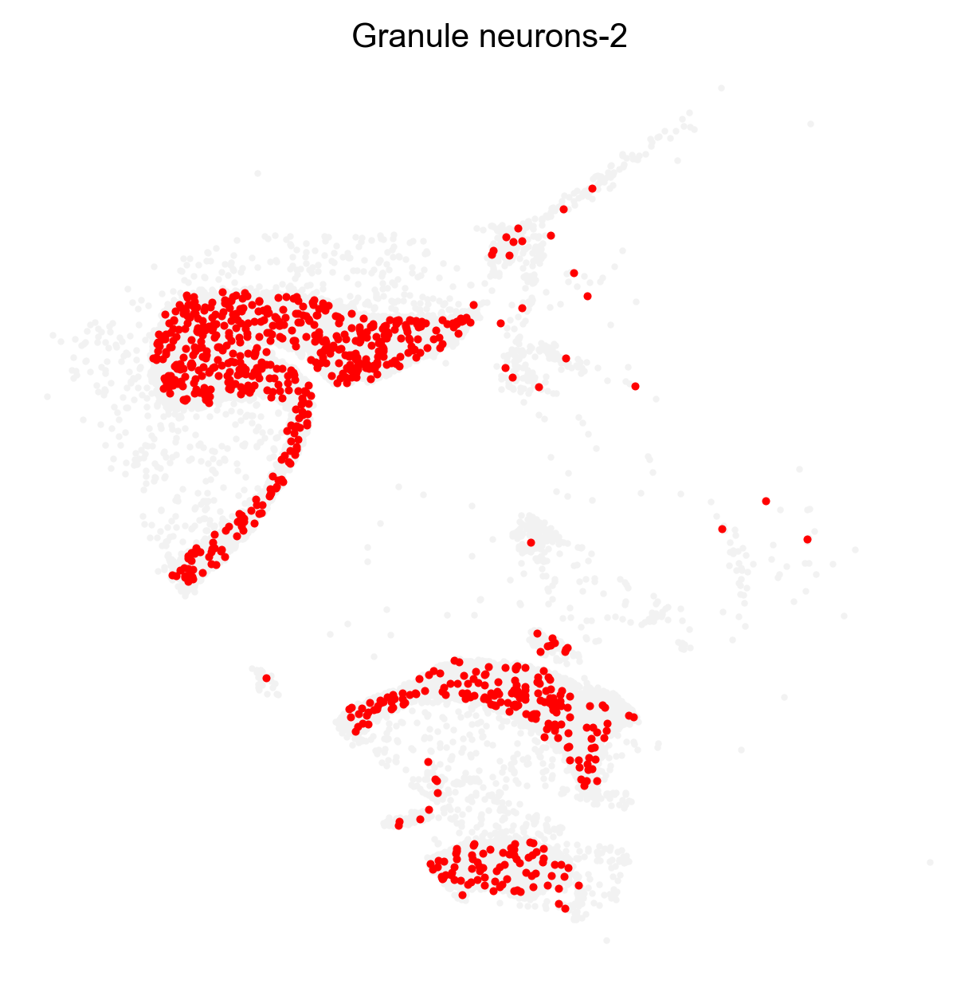

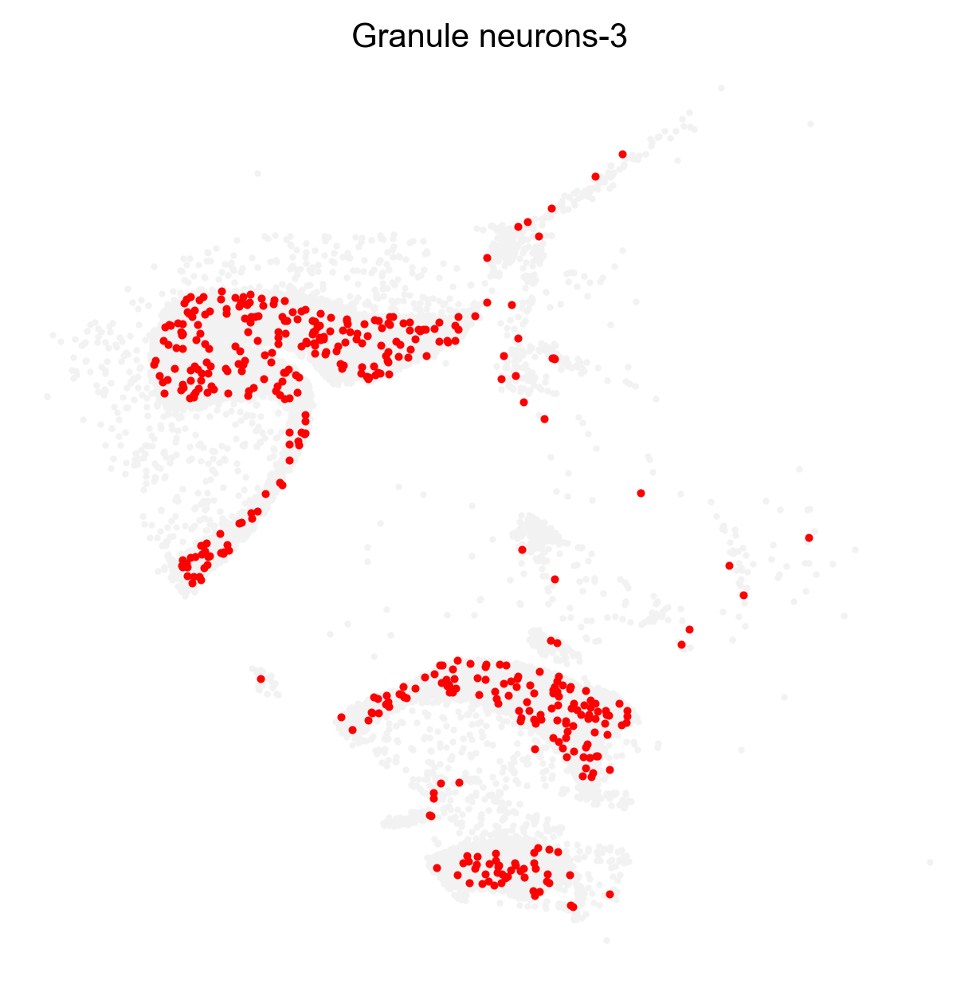

...

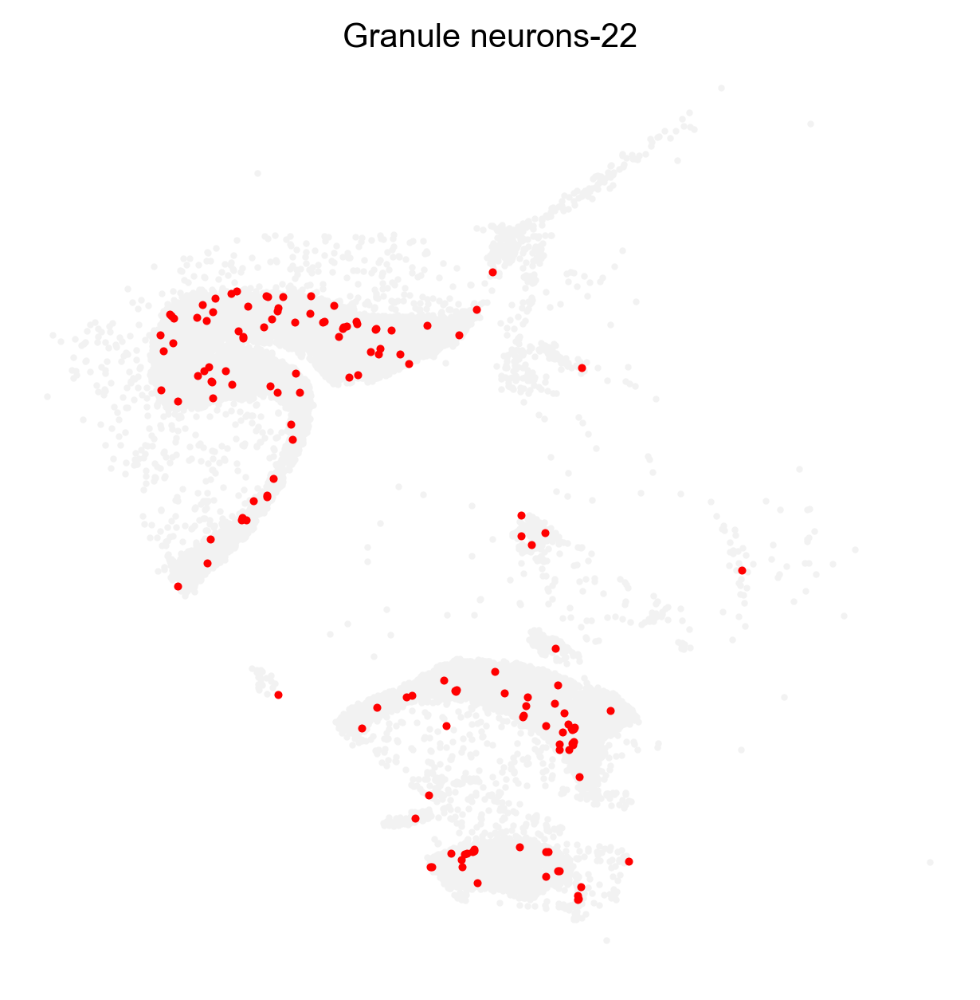

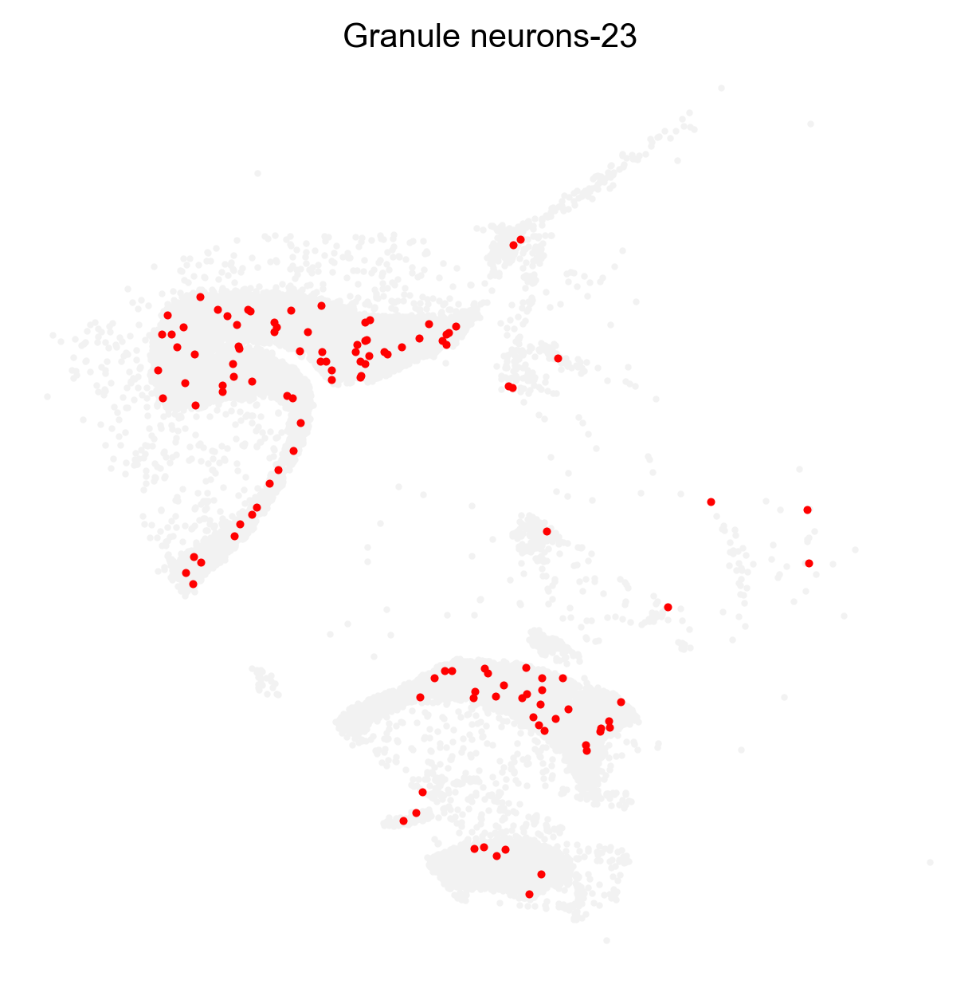

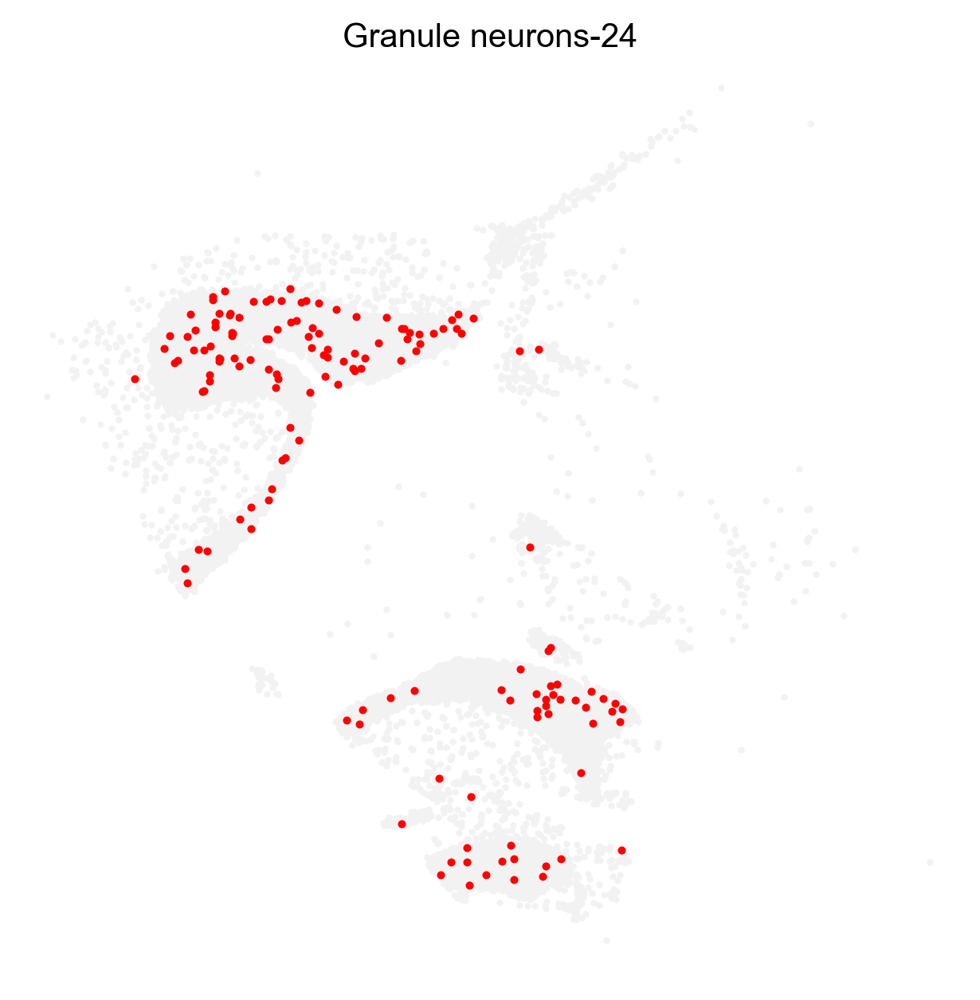

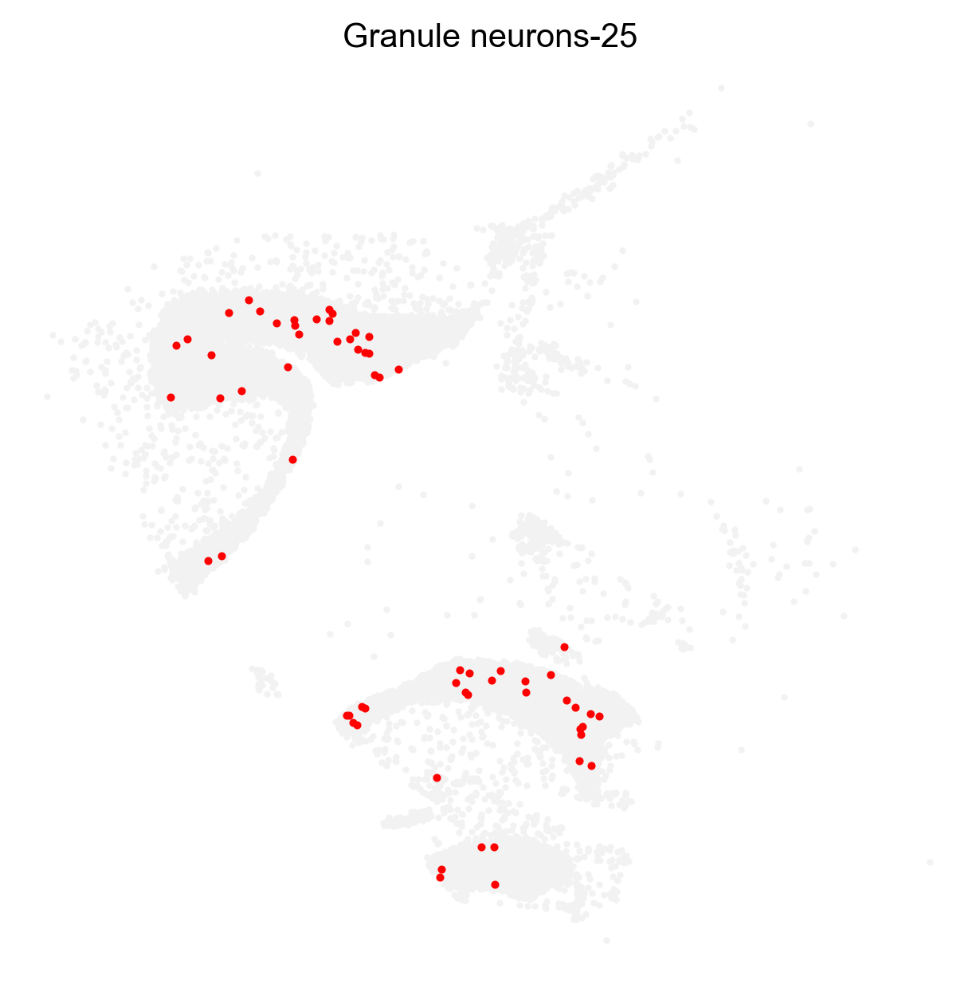

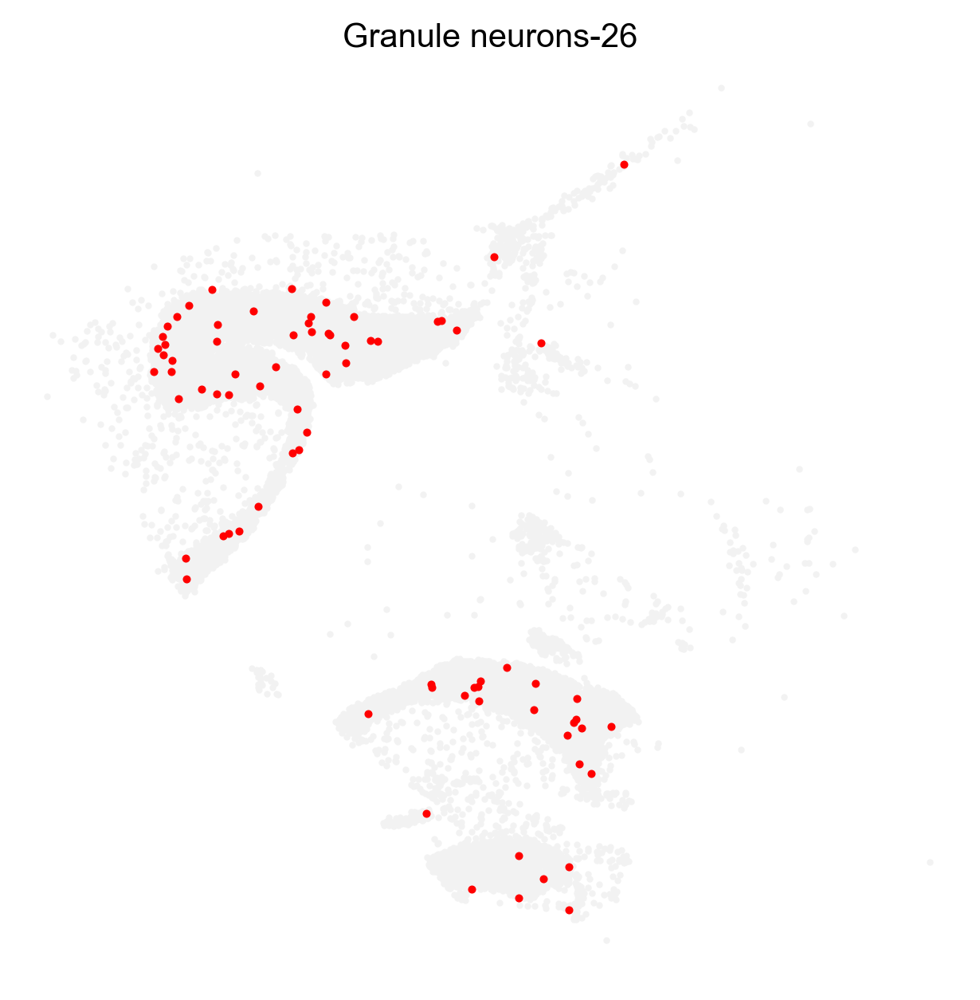

In [247]:
for i in new_cluster_names:
    test1=test.loc[test['leiden']==i,:]
    plt.figure(figsize=(5,5),dpi=300)
    plt.scatter(test['col'],test['row'],s=1,color=[0.95,0.95,0.95])
    plt.scatter(test1['col'],test1['row'],s=2,color='r')
    plt.xlim(10000,27500)
    plt.ylim(0,17500)
    plt.title(i)
    plt.axis('off')
    plt.savefig('C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\'+focus_cell_type+'\\Spatial_cell_subcluster_map_rank5\\'+focus_sample+'_'+i+'.tif')
#     break

In [172]:
#write for plot
adata_st_oligo.obs.to_csv('subcluster_'+focus_cell_type+'.csv')

In [209]:
celltypeannotaion

'C:\\Users\\yhe\\Dropbox (Harvard University)\\WeeklyUpdate2021\\CNS_Data_CellTypeAnnotation\\Rank5Label\\'

In [210]:
focus_cell_type

'Cerebellum neurons'